# **SET UP**

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.colors as mcolors

from scipy import stats
from scipy.stats import t, linregress
from matplotlib.dates import date2num, num2date
import datetime
from datetime import datetime, date, timedelta
import folium
import branca.colormap
from geopy.geocoders import Nominatim

# **Newly updated MCL function**

In [ ]:
class DataAnalyzer:
    def __init__(self, data_or_url):
        if isinstance(data_or_url, str):
            self.data_url = data_or_url
            self.data = self.load_data()
        elif isinstance(data_or_url, pd.DataFrame):
            self.data = data_or_url
        else:
            raise ValueError("Input must be a file path or a pandas DataFrame")

    def load_data(self):
        file_extension = self.data_url.split('.')[-1]
        if file_extension == 'csv':
            return pd.read_csv(self.data_url)
        elif file_extension in ['xlsx', 'xlsm', 'xltx', 'xltm']:
            return pd.read_excel(self.data_url)
        else:
            raise ValueError("Unsupported file format")

    def print_column_names(self):
        print("Column names in the dataset:", self.data.columns.tolist())

    def preprocess_data(self, well_name_column, analyte_name_column, well_name, analyte_name):
        filtered_data = self.data[(self.data[well_name_column] == well_name) & (self.data[analyte_name_column] == analyte_name)]
        filtered_data = filtered_data.dropna(subset=['COLLECTION_DATE', 'RESULT'])
        filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
        filtered_data['RESULT_LOG'] = np.log10(filtered_data['RESULT'])
        return filtered_data

    def remove_outliers(self, data, result_column='RESULT_LOG', z_threshold=4):
        z = np.abs(stats.zscore(data[result_column]))
        return data[(z < z_threshold)]

    def predict_time_at_MCL(self, slope, intercept, log_MCL, earliest_date):
        if slope >= 0:
            return None
        time_at_MCL = (log_MCL - intercept) / slope
        try:
            time_at_MCL_date = num2date(time_at_MCL).replace(tzinfo=None).date()
            if earliest_date.year < 1 or time_at_MCL_date.year >= 10000 or time_at_MCL_date <= earliest_date:
                return None
            return time_at_MCL_date
        except ValueError:
            return None

    def adjust_date_based_on_confidence(self, base_date, slope, confidence_interval, days_per_unit):
        if base_date is None or slope == 0:
            return None, None, None
        days_adjustment = confidence_interval / abs(slope) * days_per_unit
        upper_date = base_date + timedelta(days=days_adjustment) if base_date else None
        lower_date = base_date - timedelta(days=days_adjustment) if base_date else None
        return lower_date, upper_date

    def generate_analyte_summary(self, analyte_name_column, analyte_name, well_name_column, MCL):
        unique_wells = self.data[self.data[analyte_name_column] == analyte_name][well_name_column].unique()
        summary = []

        for well in unique_wells:
            query = self.preprocess_data(well_name_column, analyte_name_column, well, analyte_name)
            if query.empty or len(query['COLLECTION_DATE'].unique()) < 2:
                continue

            x = date2num(query['COLLECTION_DATE'])
            y = query['RESULT_LOG']
            slope, intercept, r_value, p_value, std_err = linregress(x, y)

            if slope > 0:
                trend = 'Increase'
            elif slope < 0:
                trend = 'Decrease'
            else:
                trend = 'Neutral'

            if trend == 'Neutral':
                continue

            log_MCL = np.log10(MCL)
            time_at_MCL = self.predict_time_at_MCL(slope, intercept, log_MCL, min(query['COLLECTION_DATE']))
            df = len(x) - 2
            ts = t.ppf(1 - 0.025, df)
            ci_slope = ts * std_err

            lower_date, upper_date = None, None
            if time_at_MCL and isinstance(time_at_MCL, date):
                lower_date, upper_date = self.adjust_date_based_on_confidence(time_at_MCL, slope, ci_slope, 365.25)

            summary.append({
                'well_name': well,
                'slope': slope,
                'trend': trend,
                'time@MCL': time_at_MCL,
                'lower_time@MCL': lower_date,
                'upper_time@MCL': upper_date
            })

        summary_df = pd.DataFrame(summary)
        return summary_df

    def compile_results(self, well_analyte_pairs, well_name_column, analyte_name_column, MCL):
        results = []
        for well_name, analyte_name in well_analyte_pairs:
            time_at_MCL = None
            query = self.preprocess_data(well_name_column, analyte_name_column, well_name, analyte_name)
            if query.empty:
                continue

            query = self.remove_outliers(query)
            x = date2num(query['COLLECTION_DATE'])
            y = query['RESULT_LOG']

            if len(x) < 2:
                continue

            slope, intercept, r_value, p_value, std_err = linregress(x, y)
            df = len(x) - 2
            ts = t.ppf(1 - 0.025, df)

            trend = "Increase" if slope > 0 else "Decrease" if slope < 0 else "Neutral"
            log_MCL = np.log10(MCL) if MCL else None
            earliest_date = min(query['COLLECTION_DATE'])
            time_at_MCL = self.predict_time_at_MCL(slope, intercept, log_MCL, earliest_date) if MCL else None

            lower_date, upper_date = None, None
            if time_at_MCL and isinstance(time_at_MCL, date):
                lower_date, upper_date = self.adjust_date_based_on_confidence(time_at_MCL, slope, ts * std_err, 365.25)

            results.append({
                'well_name': well_name,
                'slope': slope,
                'trend': trend,
                'time@MCL': time_at_MCL,
                'lower_time@MCL': lower_date,
                'upper_time@MCL': upper_date
            })

        results_df = pd.DataFrame(results)
        results_df.to_csv('time2MCL_results.csv', index=False)
        return results_df

    def plot_MCL(self, well_name_column, analyte_name_column, well_name, analyte_name, year_interval=5, save_dir='plot_MCL', MCL=None, extrapolate_until_year=2025):
        query = self.preprocess_data(well_name_column, analyte_name_column, well_name, analyte_name)
        if query.empty:
            print(f'No results found for {well_name} and {analyte_name}')
            return

        query = self.remove_outliers(query, result_column='RESULT_LOG')
        x = date2num(query['COLLECTION_DATE'])
        y = query['RESULT_LOG']

        if len(x) < 2:
            print("Not enough data for regression.")
            return

        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        df = len(x) - 2  # degrees of freedom for t-distribution
        ts = t.ppf(1 - 0.025, df)  # 95% confidence interval multiplier

        log_MCL = np.log10(MCL) if MCL else None
        time_at_MCL = self.predict_time_at_MCL(slope, intercept, log_MCL, min(query['COLLECTION_DATE'])) if MCL and slope < 0 else 'Not available'

        lower_date, upper_date = None, None
        if time_at_MCL and isinstance(time_at_MCL, date):
            lower_date, upper_date = self.adjust_date_based_on_confidence(time_at_MCL, slope, ts * std_err, 365.25)

        # Prepare for extrapolation
        extrapolate_date = np.datetime64(f'{extrapolate_until_year}-12-31')
        x_extrapolate = np.linspace(x.min(), date2num(extrapolate_date), 100)
        y_extrapolate = slope * x_extrapolate + intercept

        # Categorize and label the trend based on the slope
        trend_label = 'Increase (+)' if slope > 0 else 'Decrease (-)' if slope < 0 else 'Neutral (/)'

        plt.figure(figsize=(10, 6))
        plt.scatter(query['COLLECTION_DATE'], y, label='Data Points')
        for i, point in query.iterrows():
            plt.text(point['COLLECTION_DATE'], point['RESULT_LOG'], str(i), fontsize=6, ha='center', va='center')
        plt.plot(num2date(x_extrapolate), y_extrapolate, 'r--', label=f'Extrapolated Regression ({trend_label})')

        if log_MCL is not None:
            plt.axhline(y=log_MCL, color='green', linestyle='--', label=f'MCL (log10): {log_MCL:.2f}')

        plt.figtext(0.15, 0.05, f"Slope: {slope:.2e}\nTime@MCL: {time_at_MCL}\nLower CI: {lower_date}\nUpper CI: {upper_date}", fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        plt.xlabel('Collection Date')
        plt.ylabel('Log-Concentration (pCi/mL)')
        plt.title(f'{well_name} - {analyte_name}')
        plt.legend()

        plt.gca().xaxis.set_major_locator(mdates.YearLocator(year_interval))
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.gcf().autofmt_xdate()

        plt.xlim([num2date(x.min()), num2date(x_extrapolate.max())])

        figure_path = f'{save_dir}/{well_name}-{analyte_name}.png'
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        plt.savefig(figure_path)
        return figure_path

    def generate_analysis_dataframe(self, analyte_name_column, well_name_column, analyte_name, MCL):
        analyte_summary_df = self.generate_analyte_summary(analyte_name_column, analyte_name, well_name_column, MCL)
        analysis_data = []

        for index, row in analyte_summary_df.iterrows():
            if row['trend'] == 'Neutral':
                continue

            plot_path = self.plot_MCL(well_name_column, analyte_name_column, row['well_name'], analyte_name, year_interval=5, save_dir='plot_MCL', MCL=MCL)

            analysis_data.append({
                'analyte_name': analyte_name,
                'well_name': row['well_name'],
                'slope': row['slope'],
                'trend': row['trend'],
                'time@MCL': row['time@MCL'],
                'lower_time@MCL': row['lower_time@MCL'],
                'upper_time@MCL': row['upper_time@MCL'],
                'path_to_figure': plot_path
            })

        return pd.DataFrame(analysis_data)

    def generate_decreasing_well_list(self, analyte_name_column, analyte_name, well_name_column, MCL):
        analyte_summary_df = self.generate_analyte_summary(analyte_name_column, analyte_name, well_name_column, MCL)
        decreasing_well_list = analyte_summary_df[analyte_summary_df['trend'] == 'Decrease']['well_name'].tolist()
        return decreasing_well_list

    def extract_location_data(self, well_name_column, decreasing_well_list):
        location_data = self.data[self.data[well_name_column].isin(decreasing_well_list)]
        return location_data

In [ ]:
data_analyzer = DataAnalyzer('https://raw.githubusercontent.com/ALTEMIS-DOE/pylenm/master/notebooks/data/FASB_Data_thru_3Q2015_Reduced_Demo.csv')
data_analyzer.print_column_names()

<ipython-input-2-ca616af89e66>:14: DtypeWarning: Columns (15,22,23) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(self.data_url)


Column names in the dataset: ['ID', 'FACILITY', 'FFA_INDEX_NO', 'SRS_AREA', 'OPERABLE_UNIT', 'STATION_ID', 'STATION_TYPE', 'SEIR_ID', 'WELL_USE', 'REVISION_ID', 'SAMPLE_EVENT', 'LOG_BOOK_NO', 'SAMPLE_NAME', 'COLLECTION_DATE', 'QUARTER', 'SAMPLE_USE', 'ANALYTE_NAME', 'ANALYTICAL_METHOD', 'CAS_No', 'FILTERED_UNFILTERED', 'MDL', 'PQL', 'EPA_STORET___EMS_QUALIFIERS', 'EPA_FUNCT_GUIDE_CODE', 'LAB_QUALIFICATION', 'DATA_QUALIFERS', 'RESULT', 'RESULT_UNITS', 'COUNTING_UNCERTAINTY', 'MATRIX_CODE', 'VALIDATION_STATUS', 'FIELD_QC_CODE', 'LAB_QC_CODE', 'LAB_CODE', 'ANALYTE_TYPE', 'DILUTION_FACTOR', 'SAMPLER_COMMENTS']


# **Plot MCL for a specific well**

<ipython-input-2-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date


'plot_MCL/FBI 14D-IODINE-129.png'

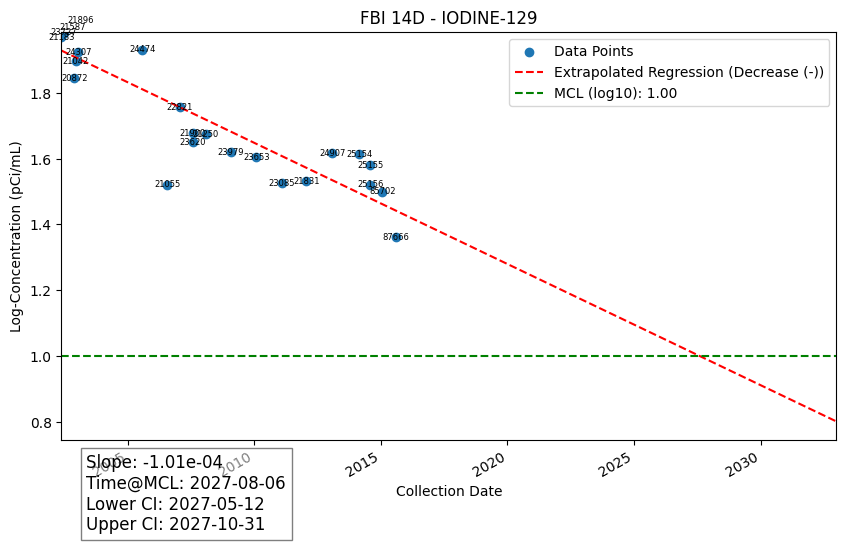

In [ ]:
data_analyzer.plot_MCL(
    well_name_column='STATION_ID',
    analyte_name_column='ANALYTE_NAME',
    well_name='FBI 14D',
    analyte_name='IODINE-129',
    MCL=10,
    extrapolate_until_year=2032
)

# **Data Frame Table**

# ***Sr-90***

In [ ]:
analyte_summary_df_sr_90 = data_analyzer.generate_analyte_summary(
    analyte_name_column='ANALYTE_NAME',
    analyte_name='STRONTIUM-90',
    well_name_column='STATION_ID',
    MCL=10
)
print(analyte_summary_df_sr_90)

<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-9-ca616af89

   well_name     slope     trend    time@MCL lower_time@MCL upper_time@MCL
0    FPZ  6A -0.000209  Decrease  2025-05-23     2025-03-21     2025-07-25
1    FSB 97C -0.000144  Decrease  2020-07-21     2020-06-04     2020-09-06
2    FSB 98C -0.000142  Decrease  2020-08-09     2020-07-01     2020-09-17
3    FSB 91C -0.000053  Decrease  2049-04-08     2048-07-14     2050-01-01
4    FBI 15D  0.001644  Increase        None           None           None
..       ...       ...       ...         ...            ...            ...
69   FPZ  8A -0.000427  Decrease  2011-10-10     2011-06-11     2012-02-08
70   FAS-093 -0.000071  Decrease  2008-09-23     2006-10-24     2010-08-24
71   FSB141D -0.001258  Decrease        None           None           None
72   FAS-091 -0.000209  Decrease  2013-02-08     2012-01-23     2014-02-25
73   FSB129D -0.000466  Decrease        None           None           None

[74 rows x 6 columns]


# ***I-129***

In [ ]:
analyte_summary_df_i_129 = data_analyzer.generate_analyte_summary(
    analyte_name_column='ANALYTE_NAME',
    analyte_name='IODINE-129',
    well_name_column='STATION_ID',
    MCL=10
)
print(analyte_summary_df_i_129)

<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10

   well_name     slope     trend    time@MCL lower_time@MCL upper_time@MCL
0    FPZ  7B  0.000016  Increase        None           None           None
1    FSB 91C  0.000023  Increase        None           None           None
2    FBI 17D -0.000714  Decrease  2006-10-26     2006-08-08     2007-01-13
3    FSB 90D -0.000088  Decrease  2031-10-02     2031-05-15     2032-02-19
4    FSB118D  0.000084  Increase        None           None           None
..       ...       ...       ...         ...            ...            ...
83   FSB146D  0.001088  Increase        None           None           None
84   FSB145D  0.000533  Increase        None           None           None
85   FSB143D  0.000662  Increase        None           None           None
86   FSB144D -0.002176  Decrease  2015-10-01     2014-01-29     2017-06-02
87   FSB142D  0.000546  Increase        None           None           None

[88 rows x 6 columns]


<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-9-ca616af89e66>:26: UserWarning: Could not inf

# **Store Data Frame for a Specific Analyte**

# ***Sr-90***

<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-9-ca616af89e66>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-9-ca616af89

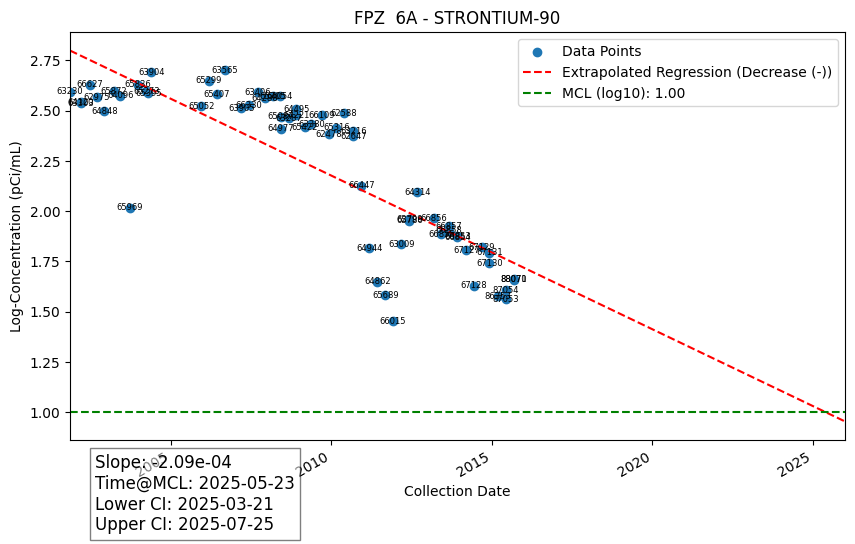

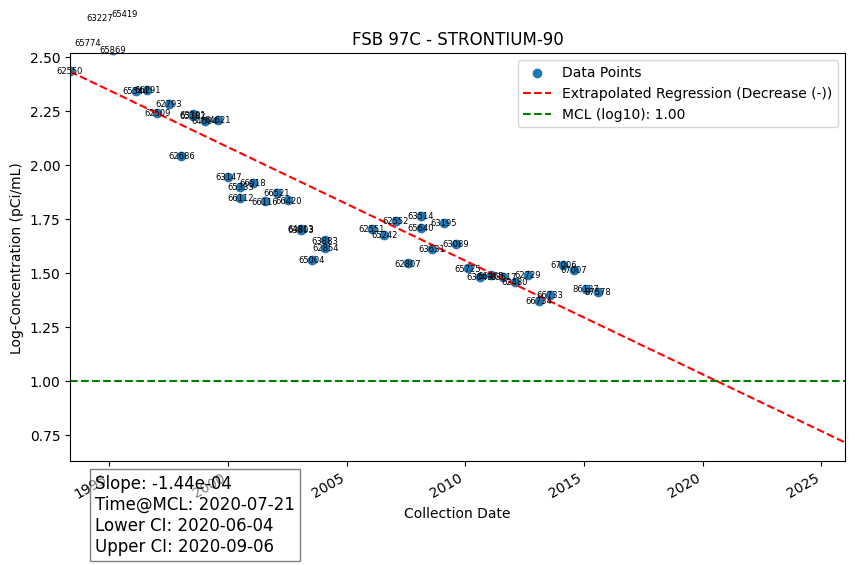

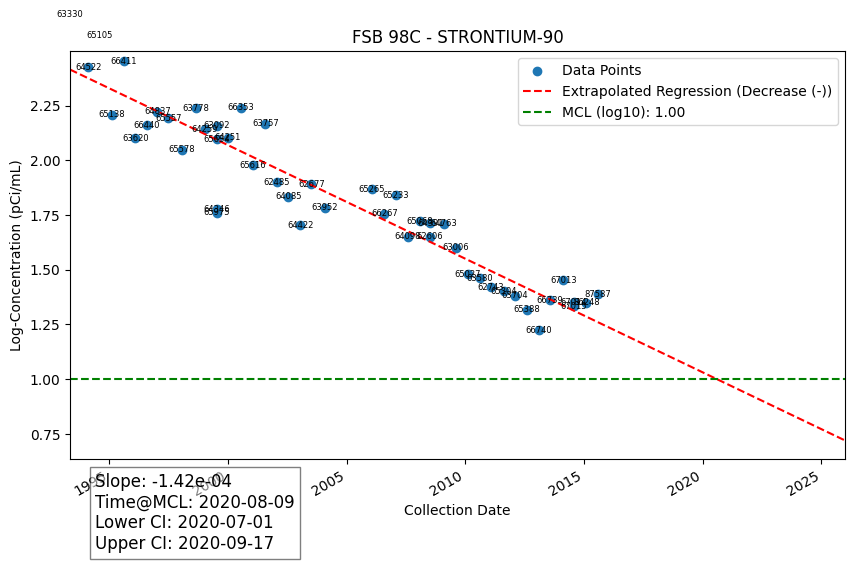

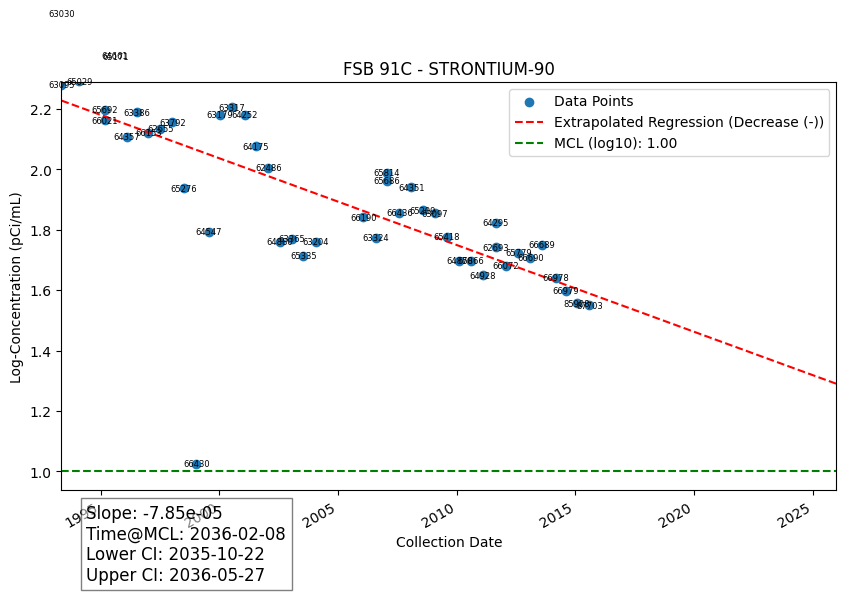

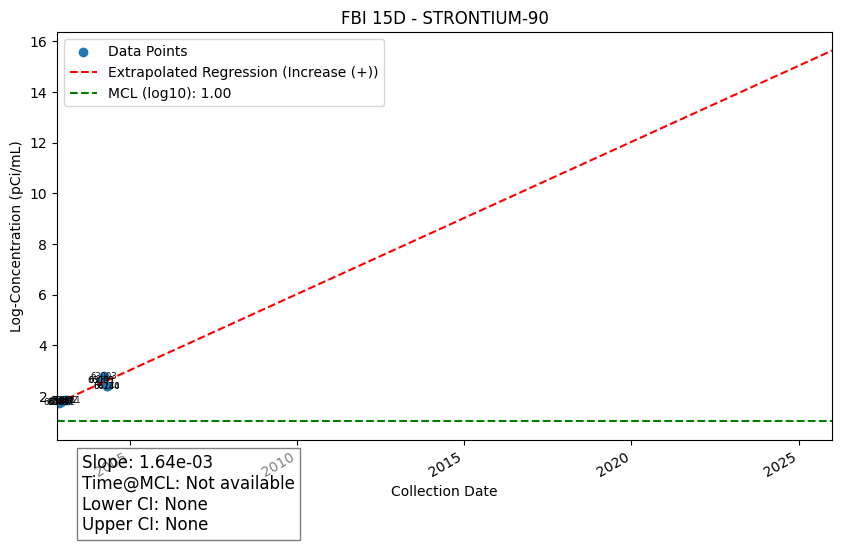

...

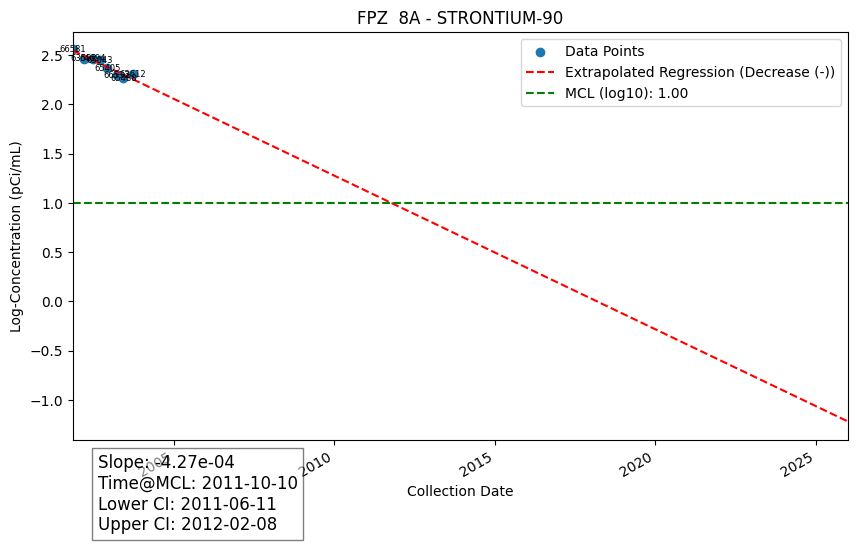

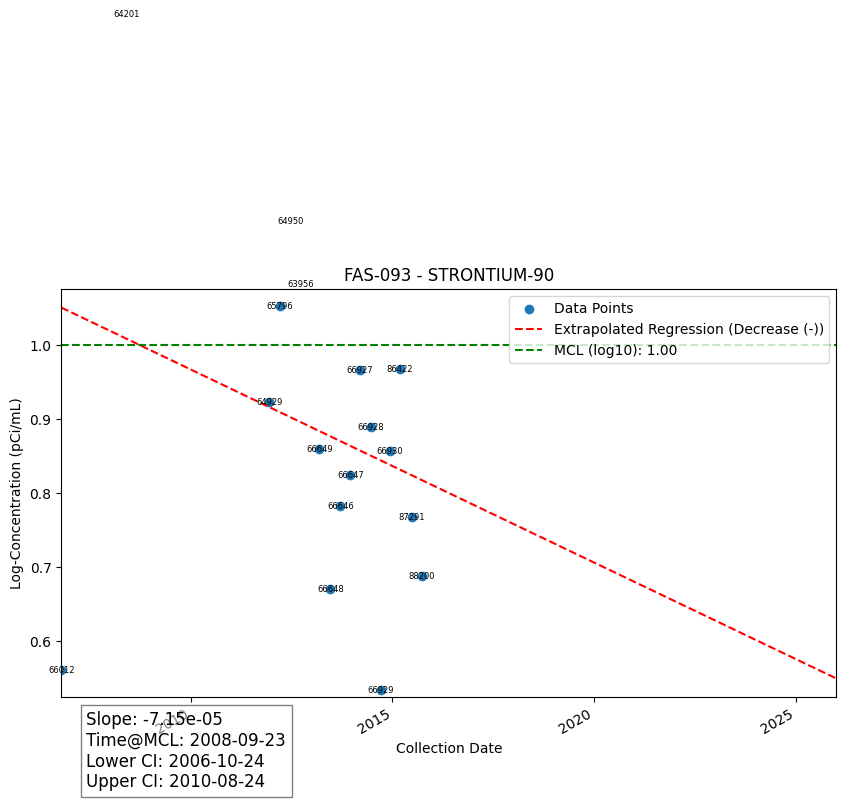

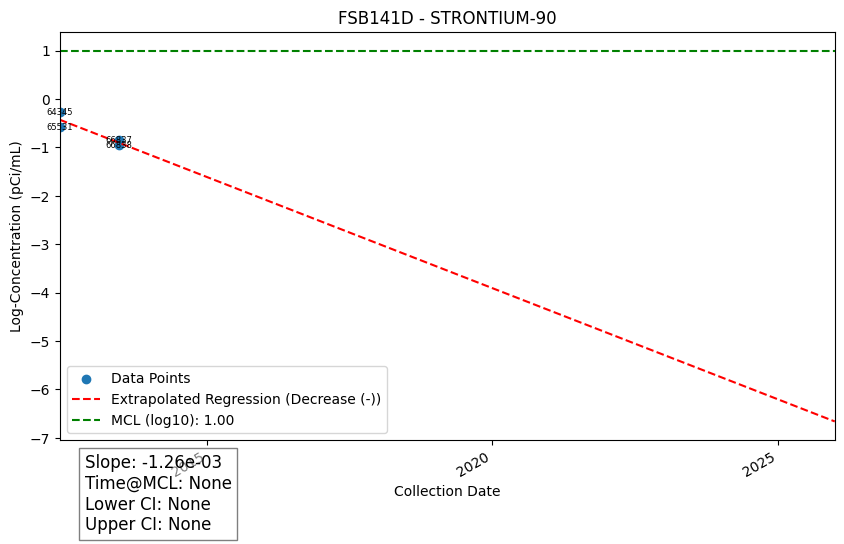

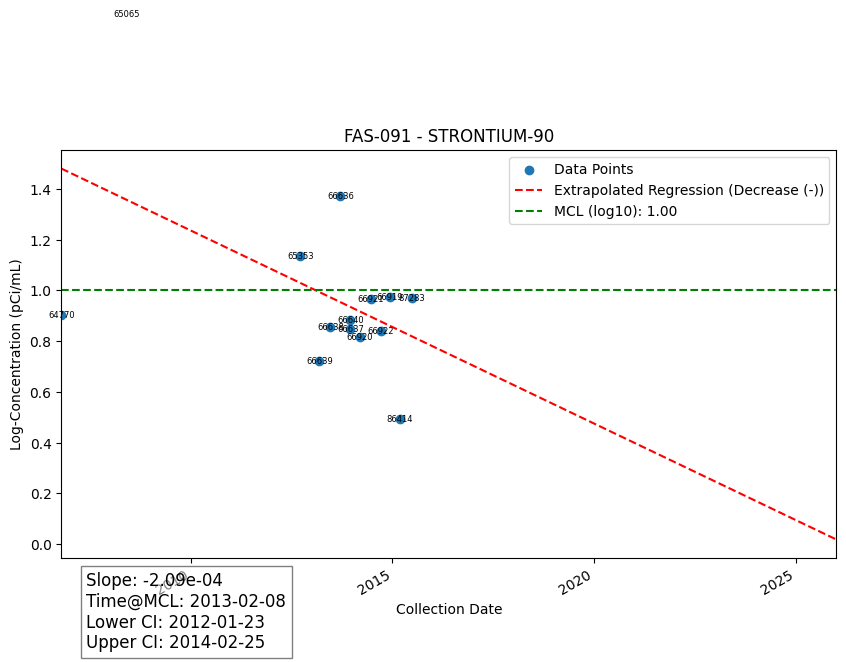

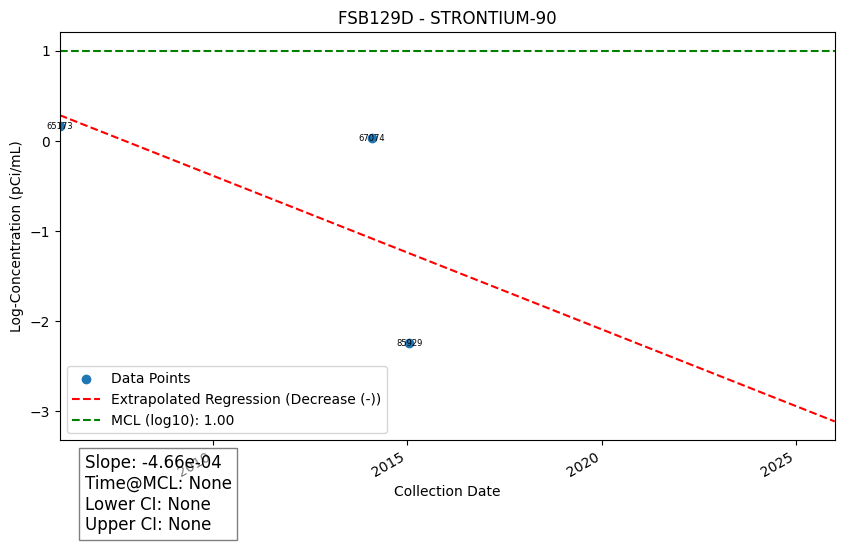

In [ ]:
sr_90_data_frame = data_analyzer.generate_analysis_dataframe(
    'ANALYTE_NAME',
    'STATION_ID',
    'STRONTIUM-90',
    10)

# ***I-129***

<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python

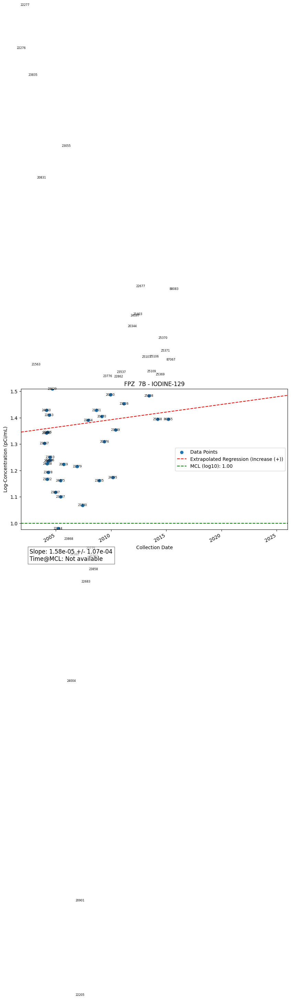

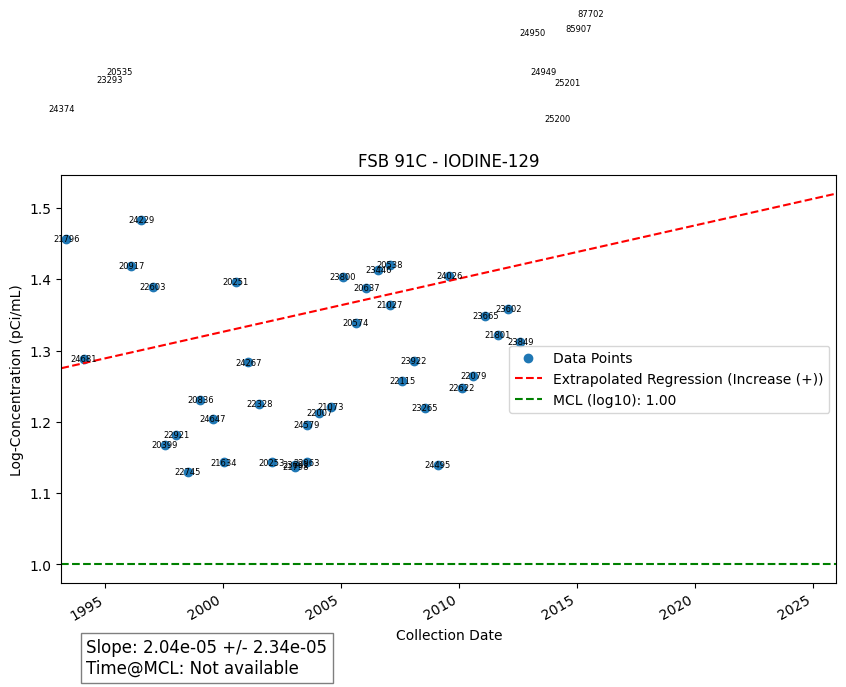

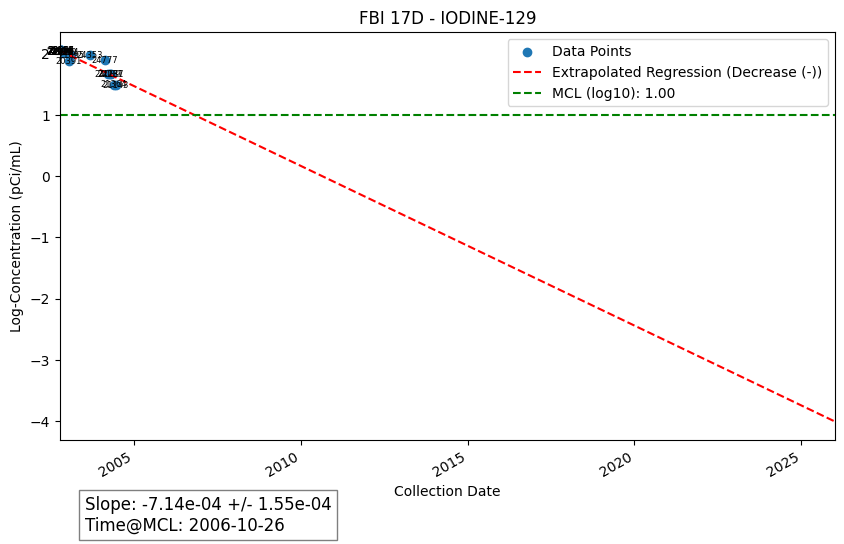

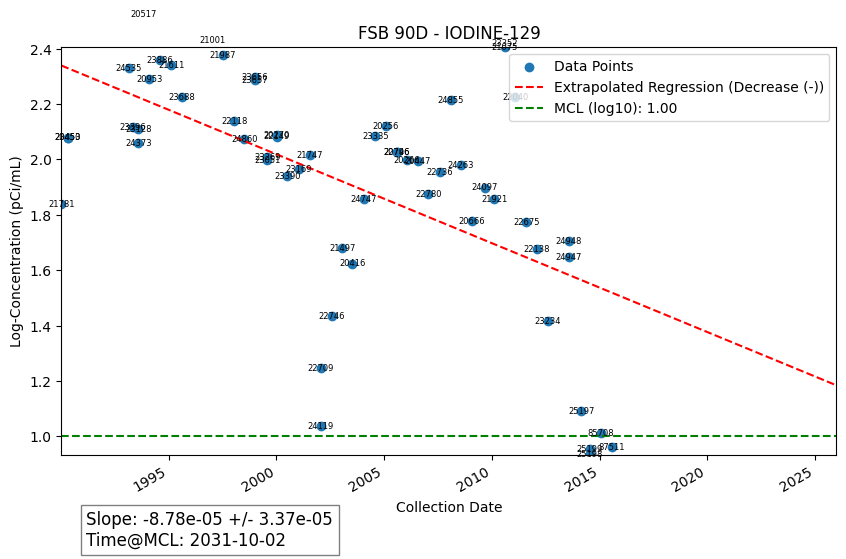

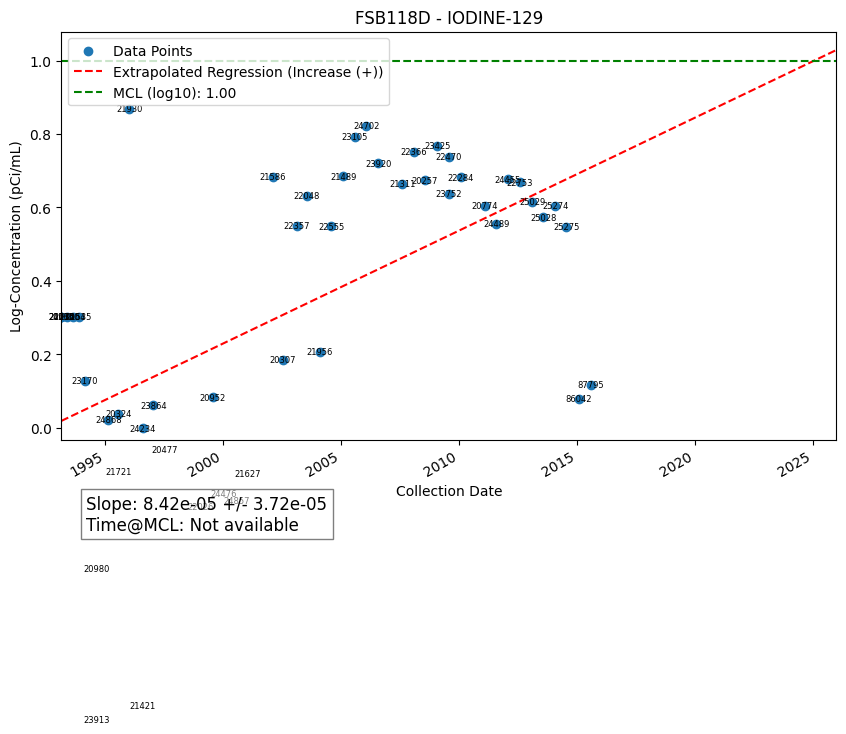

...

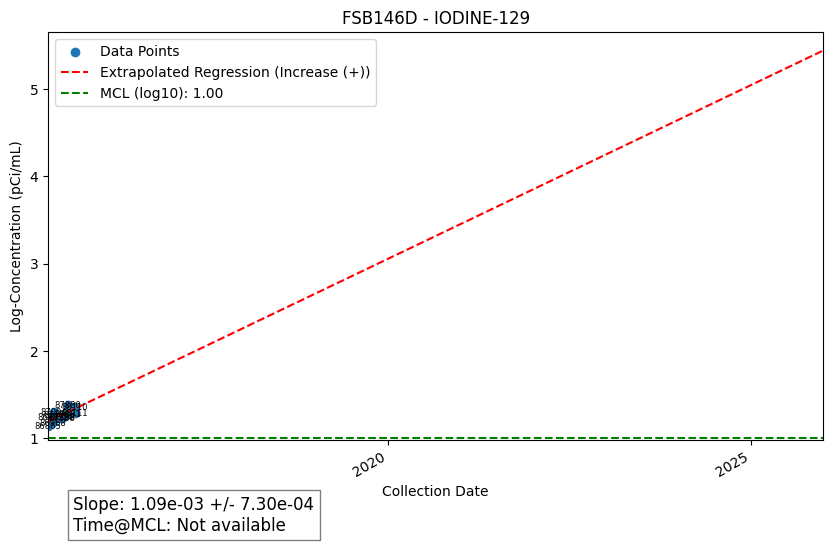

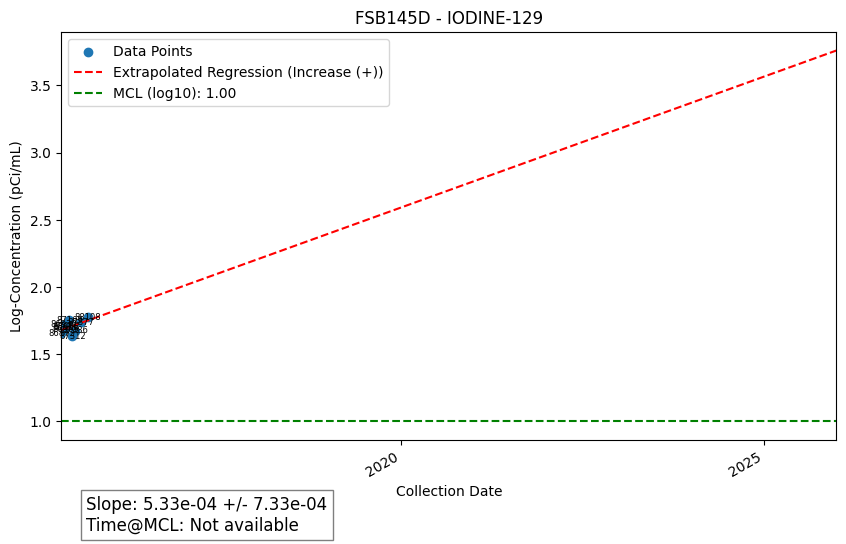

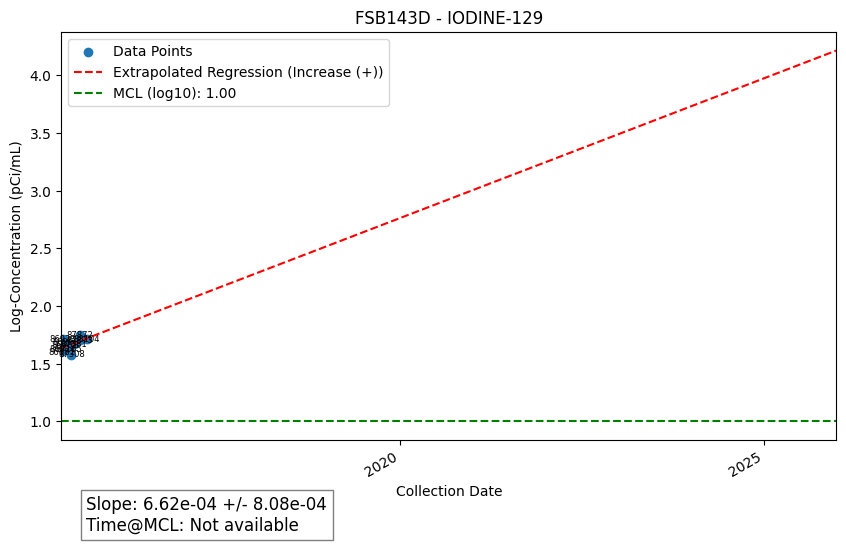

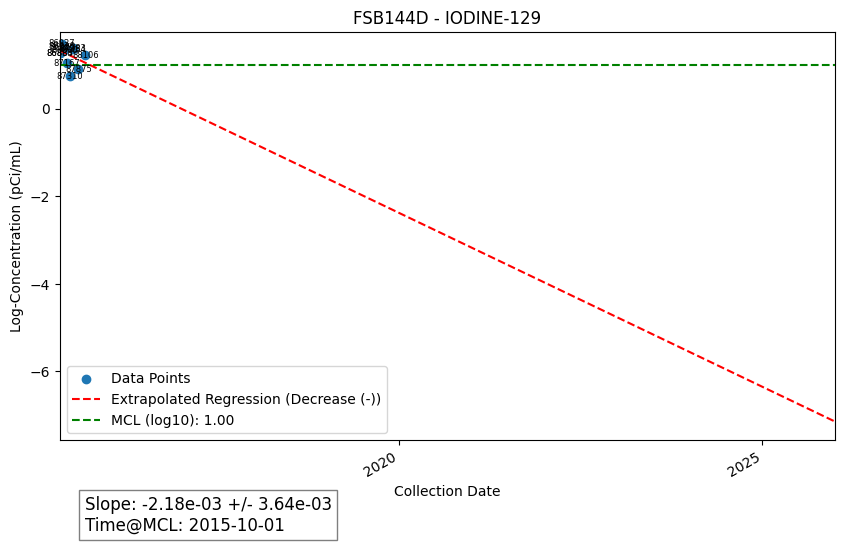

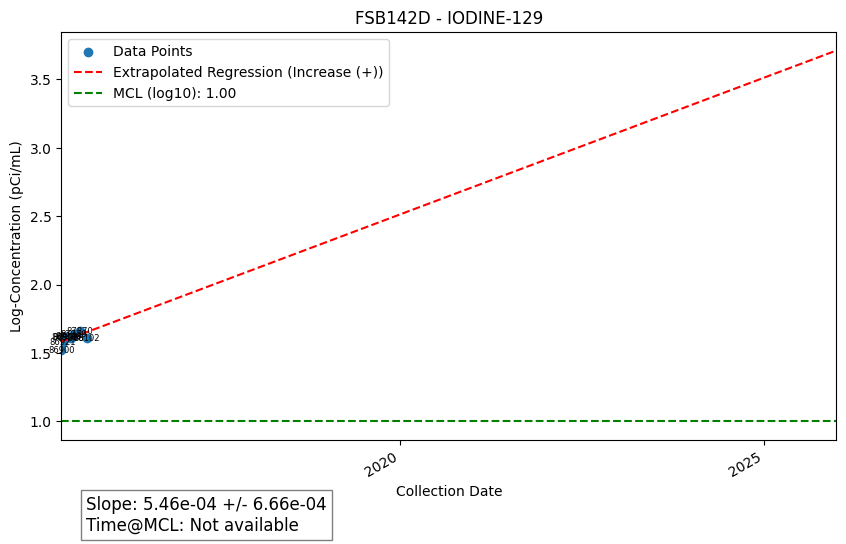

In [ ]:
i_129_data_frame = data_analyzer.generate_analysis_dataframe(
    'ANALYTE_NAME',
    'STATION_ID',
    'IODINE-129',
    10)

# **Report**

In [ ]:
def report_of_data_frame(df, original_data, analyte_name):
    df['total_decrease_duration'].hist(bins=20)
    plt.title('Histogram of Total Decrease Duration')
    plt.xlabel('Total Decrease Duration (days)')
    plt.ylabel('Frequency')
    plt.show()

    total_decrease_duration = df['total_decrease_duration'].sum()
    print(f"Overall Total Decrease Duration: {total_decrease_duration} days")

    trend_counts = df['trend'].value_counts()
    print(f"\nTrend counts:\n{trend_counts}")

    avg_decrease_duration = df[df['trend'] == 'Decrease']['total_decrease_duration'].mean()
    print(f"Average Decrease Duration for Decreasing Wells: {avg_decrease_duration} days")

    all_wells_count = original_data[original_data['ANALYTE_NAME'] == analyte_name]['STATION_ID'].nunique()
    print(f"\nTotal number of wells in the original dataset for analyte '{analyte_name}': {all_wells_count}")

    trends_per_class = df.groupby('well_name')['trend'].value_counts().unstack(fill_value=0)
    print(f"\nTrend counts per class:\n{trends_per_class}")

    overall_trend_counts = df['trend'].value_counts()
    decreasing_wells_count = overall_trend_counts.get('Decrease', 0)
    stable_wells_count = overall_trend_counts.get('Neutral', 0)
    increasing_wells_count = overall_trend_counts.get('Increase', 0)

    print(f"\nFor the whole analyte:\nDecreasing: {decreasing_wells_count}\nStable: {stable_wells_count}\nIncreasing: {increasing_wells_count}")

    patterns = {
        'FSB**D': 'FSB\\d+D$',
        'FSB**DR': 'FSB\\d+DR$',
        'FSB Number Only': '^FSB\\d+$',
        'FPZ': '^FPZ'
    }

    for category, pattern in patterns.items():
        print(f"\nAnalysis for {category}:")
        category_well_count = original_data[original_data['STATION_ID'].str.contains(pattern, regex=True)]['STATION_ID'].nunique()
        print(f"Number of wells for {category}: {category_well_count}")

        category_df = df[df['well_name'].str.contains(pattern, regex=True)]

        category_trend_counts = category_df['trend'].value_counts()
        print(f"Trend counts for {category}:\n{category_trend_counts}")

        below_MCL_count = category_df[category_df['total_decrease_duration'] <= 0].shape[0]
        print(f"Wells already below MCL for {category}: {below_MCL_count}")

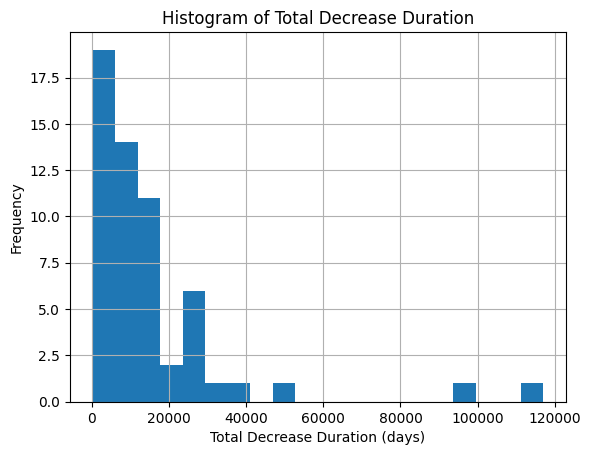

Overall Total Decrease Duration: 869385.0 days

Trend counts:
trend
Decrease    65
Increase     9
Name: count, dtype: int64
Average Decrease Duration for Decreasing Wells: 15252.368421052632 days

Total number of wells in the original dataset for analyte 'STRONTIUM-90': 149

Trend counts per class:
trend      Decrease  Increase
well_name                    
FAS-091           1         0
FAS-092           1         0
FAS-093           1         0
FAS-096           1         0
FBI 14D           1         0
FBI 15D           0         1
FBI 17D           1         0
FEX  4            1         0
FM-2BD            1         0
FMC-002F          1         0
FMC-002H          1         0
FMC-002HD         1         0
FOB  1D           1         0
FOB 14D           1         0
FPZ  3A           1         0
FPZ  6A           1         0
FPZ  6B           1         0
FPZ  7A           1         0
FPZ  8A           1         0
FPZ  8B           1         0
FPZ008AR          1         0
FPZ008BR  

In [ ]:
report_of_data_frame(sr_90_data_frame, data_analyzer.data, 'STRONTIUM-90')

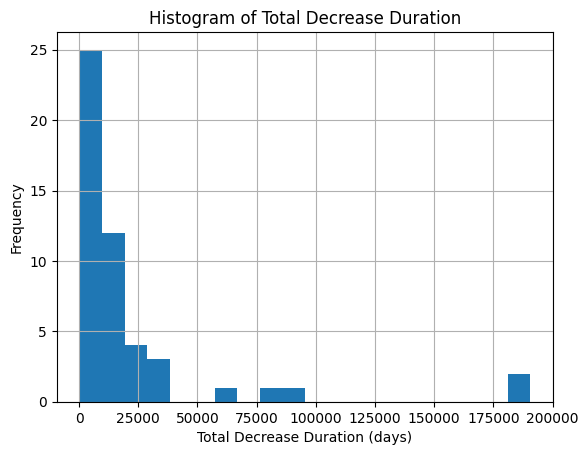

Overall Total Decrease Duration: 1117162.0 days

Trend counts:
trend
Decrease    59
Increase    29
Name: count, dtype: int64
Average Decrease Duration for Decreasing Wells: 22799.224489795917 days

Total number of wells in the original dataset for analyte 'IODINE-129': 150

Trend counts per class:
trend      Decrease  Increase
well_name                    
FAS-091           1         0
FAS-092           0         1
FAS-093           1         0
FAS-096           0         1
FBI 14D           1         0
FBI 15D           0         1
FBI 17D           1         0
FEX  4            1         0
FM-A7U            1         0
FMC-002F          0         1
FOB  1D           1         0
FOB 13D           0         1
FOB 14D           0         1
FPZ  3A           1         0
FPZ  4A           0         1
FPZ  6A           1         0
FPZ  6B           0         1
FPZ  7A           1         0
FPZ  7B           0         1
FPZ  8A           1         0
FPZ  8B           1         0
FPZ008AR   

In [ ]:
report_of_data_frame(i_129_data_frame, data_analyzer.data, 'IODINE-129')


# **Mapping**

In [ ]:
import folium
import branca.colormap as cm
from matplotlib import cm, colors as mcolors
from folium.plugins import MeasureControl
from geopy.distance import geodesic

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
location_analyzer = DataAnalyzer('/content/gdrive/MyDrive/MIT Project - VAL @HW_CEE/FASB Well Construction Info.xlsx')

In [ ]:
location_analyzer.print_column_names()

Column names in the dataset: ['facility_id', 'site_group', 'site_name', 'station_id', 'station_type', 'well use', 'aquifer', 'well_use', 'latitude', 'longitude', 'easting', 'northing', 'SZ_TOP(ft MSL)', 'SZ_BOT(ft MSL)', 'ground_elevation', 'reference_elevation_code', 'reference_elevation', 'total_depth', 'constr_obj_diameter', 'constr_obj_material', 'pump_type', 'completion_date', 'date_sealed']


In [ ]:
def calculate_real_distances(min_latitude, max_latitude, min_longitude, max_longitude):
    width = geodesic((min_latitude, min_longitude), (min_latitude, max_longitude)).meters
    height = geodesic((min_latitude, min_longitude), (max_latitude, min_longitude)).meters
    return width, height

In [ ]:
def generate_map(df, duration_column, zoom_level_offset=10):
    center_latitude = df['latitude'].mean()
    center_longitude = df['longitude'].mean()

    max_latitude = df['latitude'].max()
    min_latitude = df['latitude'].min()
    max_longitude = df['longitude'].max()
    min_longitude = df['longitude'].min()
    max_delta = max(max_latitude - min_latitude, max_longitude - min_longitude)
    zoom_level = zoom_level_offset - int(np.log2(max_delta))

    m = folium.Map(location=[center_latitude, center_longitude], zoom_start=zoom_level)

    conc_fg = folium.FeatureGroup(name="Concentrations")

    cmap_jet = cm.get_cmap('jet')
    num_colors = 6
    color_list = [mcolors.rgb2hex(cmap_jet(i / num_colors)) for i in range(num_colors)]

    df['duration_years'] = df[duration_column] / 365.25

    df['log_duration_years'] = np.log(df['duration_years'])

    min_val_log = df['log_duration_years'].min()
    max_val_log = df['log_duration_years'].max()
    df['normalized_log_duration'] = (df['log_duration_years'] - min_val_log) / (max_val_log - min_val_log)

    cmap = mcolors.LinearSegmentedColormap.from_list('custom_colormap', color_list)

    for _, row in df.iterrows():
        coordinates = [row['latitude'], row['longitude']]
        point_color = mcolors.rgb2hex(cmap(row['normalized_log_duration']))
        popup_content = f"<div style='max-width:800px;'><ul>"
        popup_content += f"<li>Well Name: {row['well_name']}</li>"
        popup_content += f"<li>Time to MCL: {row['total_decrease_duration']} days ({row['duration_years']:.2f} Years)</li>"
        popup_content += "</ul></div>"
        folium.Circle(
            radius=15,
            location=coordinates,
            popup=folium.Popup(popup_content, max_width=800),
            fill_color=point_color,
            color='#000000',
            fill_opacity=1,
            stroke=1,
            weight=1
        ).add_to(conc_fg)

    m.add_child(conc_fg)

    colormap_log = folium.LinearColormap(colors=color_list, vmin=min_val_log, vmax=max_val_log, caption="Log Scale")
    colormap_log.add_to(m)

    min_val = df[duration_column].min()
    max_val = df[duration_column].max()

    min_val_years = min_val / 365.25
    max_val_years = max_val / 365.25

    colormap_original = folium.LinearColormap(colors=color_list, vmin=min_val_years, vmax=max_val_years, caption=f"{duration_column} (years)")
    colormap_original.add_to(m)

    width_meters, height_meters = calculate_real_distances(min_latitude, max_latitude, min_longitude, max_longitude)

    folium.Marker(
        [min_latitude, (min_longitude + max_longitude) / 2],
        icon=folium.DivIcon(html=f"<div style='font-size: 12pt'>Width: {width_meters:.2f} meters</div>")
    ).add_to(m)
    folium.Marker(
        [(min_latitude + max_latitude) / 2, min_longitude],
        icon=folium.DivIcon(html=f"<div style='font-size: 12pt; transform: rotate(90deg)'>Height: {height_meters:.2f} meters</div>")
    ).add_to(m)

    bounding_box = [
        [min_latitude, min_longitude],
        [min_latitude, max_longitude],
        [max_latitude, max_longitude],
        [max_latitude, min_longitude],
        [min_latitude, min_longitude]
    ]
    folium.PolyLine(bounding_box, color='black', weight=2, opacity=1).add_to(m)

    top_horizontal_line = [
        [max_latitude, min_longitude],
        [max_latitude, max_longitude]
    ]
    bottom_horizontal_line = [
        [min_latitude, min_longitude],
        [min_latitude, max_longitude]
    ]
    left_vertical_line = [
        [min_latitude, min_longitude],
        [max_latitude, min_longitude]
    ]
    right_vertical_line = [
        [min_latitude, max_longitude],
        [max_latitude, max_longitude]
    ]

    folium.PolyLine(top_horizontal_line, color='blue', weight=2, opacity=1).add_to(m)
    folium.PolyLine(bottom_horizontal_line, color='blue', weight=2, opacity=1).add_to(m)
    folium.PolyLine(left_vertical_line, color='blue', weight=2, opacity=1).add_to(m)
    folium.PolyLine(right_vertical_line, color='blue', weight=2, opacity=1).add_to(m)

    m.save('map_with_colorbar_and_real_scales.html')

    return m

In [ ]:
def generate_satellite_map(df, duration_column, zoom_level_offset=10):
    center_latitude = df['latitude'].mean()
    center_longitude = df['longitude'].mean()

    max_latitude = df['latitude'].max()
    min_latitude = df['latitude'].min()
    max_longitude = df['longitude'].max()
    min_longitude = df['longitude'].min()
    max_delta = max(max_latitude - min_latitude, max_longitude - min_longitude)
    zoom_level = zoom_level_offset - int(np.log2(max_delta))

    m = folium.Map(location=[center_latitude, center_longitude], zoom_start=zoom_level)

    folium.TileLayer(
        tiles='https://{s}.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
        attr='Google',
        name='Google Satellite',
        max_zoom=20,
        subdomains=['mt0', 'mt1', 'mt2', 'mt3']
    ).add_to(m)

    conc_fg = folium.FeatureGroup(name="Concentrations")

    cmap_jet = cm.get_cmap('jet')
    num_colors = 6
    color_list = [mcolors.rgb2hex(cmap_jet(i / num_colors)) for i in range(num_colors)]

    df['duration_years'] = df[duration_column] / 365.25

    df['log_duration_years'] = np.log(df['duration_years'])

    min_val_log = df['log_duration_years'].min()
    max_val_log = df['log_duration_years'].max()
    df['normalized_log_duration'] = (df['log_duration_years'] - min_val_log) / (max_val_log - min_val_log)

    cmap = mcolors.LinearSegmentedColormap.from_list('custom_colormap', color_list)

    for _, row in df.iterrows():
        coordinates = [row['latitude'], row['longitude']]
        point_color = mcolors.rgb2hex(cmap(row['normalized_log_duration']))
        popup_content = f"<div style='max-width:800px;'><ul>"
        popup_content += f"<li>Well Name: {row['well_name']}</li>"
        popup_content += f"<li>Time to MCL: {row['total_decrease_duration']} days ({row['duration_years']:.2f} Years)</li>"
        popup_content += "</ul></div>"
        folium.Circle(
            radius=15,
            location=coordinates,
            popup=folium.Popup(popup_content, max_width=800),
            fill_color=point_color,
            color='#000000',
            fill_opacity=1,
            stroke=1,
            weight=1
        ).add_to(conc_fg)

    m.add_child(conc_fg)

    colormap_log = folium.LinearColormap(colors=color_list, vmin=min_val_log, vmax=max_val_log, caption="Log Scale")
    colormap_log.add_to(m)

    min_val = df[duration_column].min()
    max_val = df[duration_column].max()

    min_val_years = min_val / 365.25
    max_val_years = max_val / 365.25

    colormap_original = folium.LinearColormap(colors=color_list, vmin=min_val_years, vmax=max_val_years, caption=f"{duration_column} (years)")
    colormap_original.add_to(m)

    width_meters, height_meters = calculate_real_distances(min_latitude, max_latitude, min_longitude, max_longitude)

    folium.Marker(
        [min_latitude, (min_longitude + max_longitude) / 2],
        icon=folium.DivIcon(html=f"<div style='font-size: 12pt'>Width: {width_meters:.2f} meters</div>")
    ).add_to(m)
    folium.Marker(
        [(min_latitude + max_latitude) / 2, min_longitude],
        icon=folium.DivIcon(html=f"<div style='font-size: 12pt; transform: rotate(90deg)'>Height: {height_meters:.2f} meters</div>")
    ).add_to(m)

    bounding_box = [
        [min_latitude, min_longitude],
        [min_latitude, max_longitude],
        [max_latitude, max_longitude],
        [max_latitude, min_longitude],
        [min_latitude, min_longitude]
    ]
    folium.PolyLine(bounding_box, color='black', weight=2, opacity=1).add_to(m)

    top_horizontal_line = [
        [max_latitude, min_longitude],
        [max_latitude, max_longitude]
    ]
    bottom_horizontal_line = [
        [min_latitude, min_longitude],
        [min_latitude, max_longitude]
    ]
    left_vertical_line = [
        [min_latitude, min_longitude],
        [max_latitude, min_longitude]
    ]
    right_vertical_line = [
        [min_latitude, max_longitude],
        [max_latitude, max_longitude]
    ]

    folium.PolyLine(top_horizontal_line, color='blue', weight=2, opacity=1).add_to(m)
    folium.PolyLine(bottom_horizontal_line, color='blue', weight=2, opacity=1).add_to(m)
    folium.PolyLine(left_vertical_line, color='blue', weight=2, opacity=1).add_to(m)
    folium.PolyLine(right_vertical_line, color='blue', weight=2, opacity=1).add_to(m)

    m.save('map_with_colorbar_and_real_scales.html')

    return m

## **Sr-90**

In [ ]:
decreasing_well_list = data_analyzer.generate_decreasing_well_list(
    analyte_name_column='ANALYTE_NAME',
    analyte_name='STRONTIUM-90',
    well_name_column='STATION_ID',
    MCL=10
)

location_data = location_analyzer.extract_location_data(
    well_name_column='station_id',
    decreasing_well_list=decreasing_well_list
)

merged_df_sr_90 = pd.merge(analyte_summary_df_sr_90, location_data, left_on='well_name', right_on='station_id', how='inner')

print(merged_df_sr_90)

<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-119-c67

   well_name     slope     trend    time@MCL  total_decrease_duration  \
0    FPZ  6A -0.000209  Decrease  2025-05-23                   8592.0   
1    FSB 97C -0.000144  Decrease  2020-07-21                   9938.0   
2    FSB 98C -0.000142  Decrease  2020-08-09                   9953.0   
3    FSB 91C -0.000053  Decrease  2049-04-08                  20500.0   
4     FSB 79 -0.000093  Decrease  2034-05-14                  16196.0   
5    FSP204A -0.000052  Decrease  2079-02-21                  27271.0   
6    FPZ  7A -0.000247  Decrease  2015-06-28                   4975.0   
7    FSB 98D -0.000108  Decrease  2024-02-13                  11297.0   
8    FAS-092 -0.000252  Decrease  2018-12-30                   4456.0   
9    FPZ  8B -0.000300  Decrease  2014-09-08                   4682.0   
10   FSB112D -0.000358  Decrease  2008-12-27                   6534.0   
11   FSB 94C -0.000016  Decrease  2313-07-18                 117024.0   
12  FSB 94DR -0.000034  Decrease  2071-10-07       

<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, 

In [ ]:
generate_map(merged_df_sr_90, 'total_decrease_duration')

<ipython-input-134-34a79a73fc64>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_jet = cm.get_cmap('jet')


In [ ]:
generate_map(merged_df_sr_90, 'total_decrease_duration', zoom_level_offset=11)

<ipython-input-134-34a79a73fc64>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_jet = cm.get_cmap('jet')


In [ ]:
generate_satellite_map(merged_df_sr_90, 'total_decrease_duration')

<ipython-input-135-14f22170f319>:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_jet = cm.get_cmap('jet')


## **I-129**

In [ ]:
# DataFrame with decreasing trends
decreasing_well_list = data_analyzer.generate_decreasing_well_list(
    analyte_name_column='ANALYTE_NAME',
    analyte_name='IODINE-129',
    well_name_column='STATION_ID',
    MCL=10
)

# Extract latitude and longitude
location_data = location_analyzer.extract_location_data(
    well_name_column='station_id',
    decreasing_well_list=decreasing_well_list
)

# Merge DataFrame with latitude and longitude information
merged_df_i_129 = pd.merge(analyte_summary_df_i_129, location_data, left_on='well_name', right_on='station_id', how='inner')

print(merged_df_i_129)

<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python

   well_name         slope     trend    time@MCL  total_decrease_duration  \
0    FBI 17D -7.144072e-04  Decrease  2006-10-26                   1471.0   
1    FSB 90D -8.784643e-05  Decrease  2031-10-02                  15243.0   
2    FSB 97C -4.874920e-05  Decrease  2034-06-30                  15104.0   
3    FSB 79C -5.406589e-05  Decrease  2036-06-09                  16953.0   
4    FPZ  3A -1.894625e-04  Decrease        None                      NaN   
5    FPZ  7A -1.797963e-04  Decrease  2024-04-07                   8181.0   
6    FSP 47A -2.252554e-04  Decrease  2015-01-05                   3903.0   
7    FSB135D -4.132313e-05  Decrease  2028-11-25                   8913.0   
8    FSB106C -4.607340e-05  Decrease  2047-09-03                  21059.0   
9    FSB 92D -2.446015e-05  Decrease  2080-11-17                  33188.0   
10   FAS-091 -2.009164e-04  Decrease  2029-01-12                   8122.0   
11   FSB127D -1.685398e-04  Decrease        None                      NaN   

<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  filtered_data['COLLECTION_DATE'] = pd.to_datetime(filtered_data['COLLECTION_DATE']).dt.date
<ipython-input-119-c67e78ba5efc>:26: UserWarning: Could

In [ ]:
generate_map(merged_df_i_129, 'total_decrease_duration', zoom_level_offset=9)

<ipython-input-134-34a79a73fc64>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_jet = cm.get_cmap('jet')


In [ ]:
generate_satellite_map(merged_df_i_129, 'total_decrease_duration')

<ipython-input-135-14f22170f319>:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_jet = cm.get_cmap('jet')
